In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns 

In [2]:
# Read the data in the csv file Aviation_Data
df= pd.read_csv('../Data/Aviation_Data.csv', parse_dates=['Event.Date', 'Publication.Date'])

/home/dreampy/anaconda3/envs/learn-env/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3145: DtypeWarning: Columns (6,7,28) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


### Airline Data

In [3]:
df.head()

,Event.Id,Investigation.Type,Accident.Number,Event.Date,Location,Country,Latitude,Longitude,Airport.Code,Airport.Name,...,Purpose.of.flight,Air.carrier,Total.Fatal.Injuries,Total.Serious.Injuries,Total.Minor.Injuries,Total.Uninjured,Weather.Condition,Broad.phase.of.flight,Report.Status,Publication.Date
0,20001218X45444,Accident,SEA87LA080,1948-10-24,"MOOSE CREEK, ID",United States,NaN,NaN,NaN,NaN,...,Personal,NaN,2.0,0.0,0.0,0.0,UNK,Cruise,Probable Cause,NaT
1,20001218X45447,Accident,LAX94LA336,1962-07-19,"BRIDGEPORT, CA",United States,NaN,NaN,NaN,NaN,...,Personal,NaN,4.0,0.0,0.0,0.0,UNK,Unknown,Probable Cause,1996-09-19
2,20061025X01555,Accident,NYC07LA005,1974-08-30,"Saltville, VA",United States,36.9222,-81.8781,NaN,NaN,...,Personal,NaN,3.0,NaN,NaN,NaN,IMC,Cruise,Probable Cause,2007-02-26
3,20001218X45448,Accident,LAX96LA321,1977-06-19,"EUREKA, CA",United States,NaN,NaN,NaN,NaN,...,Personal,NaN,2.0,0.0,0.0,0.0,IMC,Cruise,Probable Cause,2000-12-09
4,20041105X01764,Accident,CHI79FA064,1979-08-02,"Canton, OH",United States,NaN,NaN,NaN,NaN,...,Personal,NaN,1.0,2.0,NaN,0.0,VMC,Approach,Probable Cause,1980-04-16


In [4]:
df.tail(10)

,Event.Id,Investigation.Type,Accident.Number,Event.Date,Location,Country,Latitude,Longitude,Airport.Code,Airport.Name,...,Purpose.of.flight,Air.carrier,Total.Fatal.Injuries,Total.Serious.Injuries,Total.Minor.Injuries,Total.Uninjured,Weather.Condition,Broad.phase.of.flight,Report.Status,Publication.Date
90338,20221219106472,Accident,DCA23LA096,2022-12-18,"Kahului, HI",United States,NaN,NaN,NaN,NaN,...,NaN,HAWAIIAN AIRLINES INC,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaT
90339,20221219106477,Accident,WPR23LA071,2022-12-18,"San Manual, AZ",United States,NaN,NaN,NaN,NaN,...,Personal,Chandler Air Service,0.0,0.0,0.0,3.0,NaN,NaN,NaN,2022-12-20
90340,20221221106483,Accident,CEN23LA067,2022-12-21,"Auburn Hills, MI",United States,NaN,NaN,NaN,NaN,...,Personal,Pilot,0.0,1.0,0.0,0.0,NaN,NaN,NaN,2022-12-22
90341,20221222106486,Accident,CEN23LA068,2022-12-21,"Reserve, LA",United States,NaN,NaN,NaN,NaN,...,Instructional,NaN,0.0,1.0,0.0,1.0,NaN,NaN,NaN,2022-12-27
90342,20221228106502,Accident,GAA23WA046,2022-12-22,"Brasnorte,",Brazil,NaN,NaN,NaN,NaN,...,NaN,NaN,1.0,0.0,0.0,0.0,NaN,NaN,NaN,2022-12-28
90343,20221227106491,Accident,ERA23LA093,2022-12-26,"Annapolis, MD",United States,NaN,NaN,NaN,NaN,...,Personal,NaN,0.0,1.0,0.0,0.0,NaN,NaN,NaN,2022-12-29
90344,20221227106494,Accident,ERA23LA095,2022-12-26,"Hampton, NH",United States,NaN,NaN,NaN,NaN,...,NaN,NaN,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaT
90345,20221227106497,Accident,WPR23LA075,2022-12-26,"Payson, AZ",United States,341525N,1112021W,PAN,PAYSON,...,Personal,NaN,0.0,0.0,0.0,1.0,VMC,NaN,NaN,2022-12-27
90346,20221227106498,Accident,WPR23LA076,2022-12-26,"Morgan, UT",United States,NaN,NaN,NaN,NaN,...,Personal,MC CESSNA 210N LLC,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaT
90347,20221230106513,Accident,ERA23LA097,2022-12-29,"Athens, GA",United States,NaN,NaN,NaN,NaN,...,Personal,NaN,0.0,1.0,0.0,1.0,NaN,NaN,NaN,2022-12-30


In [5]:
# Sum of Nan/Null values
df.isna().sum()

Event.Id                   1459
Investigation.Type            0
Accident.Number            1459
Event.Date                 1459
Location                   1511
Country                    1685
Latitude                  55966
Longitude                 55975
Airport.Code              40099
Airport.Name              37558
Injury.Severity            2459
Aircraft.damage            4653
Aircraft.Category         58061
Registration.Number        2776
Make                       1522
Model                      1551
Amateur.Built              1561
Number.of.Engines          7543
Engine.Type                8536
FAR.Description           58325
Schedule                  77766
Purpose.of.flight          7651
Air.carrier               73700
Total.Fatal.Injuries      12860
Total.Serious.Injuries    13969
Total.Minor.Injuries      13392
Total.Uninjured            7371
Weather.Condition          5951
Broad.phase.of.flight     28624
Report.Status              7840
Publication.Date          16689
dtype: i

In [6]:
df.describe(datetime_is_numeric=True)

,Event.Date,Number.of.Engines,Total.Fatal.Injuries,Total.Serious.Injuries,Total.Minor.Injuries,Total.Uninjured,Publication.Date
count,88889,82805.000000,77488.000000,76379.000000,76956.000000,82977.000000,73659
mean,1999-09-17 17:13:39.354475904,1.146585,0.647855,0.279881,0.357061,5.325440,2004-05-01 19:38:20.932676224
min,1948-10-24 00:00:00,0.000000,0.000000,0.000000,0.000000,0.000000,1980-04-16 00:00:00
25%,1989-01-15 00:00:00,1.000000,0.000000,0.000000,0.000000,0.000000,1993-09-14 00:00:00
50%,1998-07-18 00:00:00,1.000000,0.000000,0.000000,0.000000,1.000000,2001-10-07 00:00:00
75%,2009-07-01 00:00:00,1.000000,0.000000,0.000000,0.000000,2.000000,2020-09-25 00:00:00
max,2022-12-29 00:00:00,8.000000,349.000000,161.000000,380.000000,699.000000,2022-12-30 00:00:00
std,NaN,0.446510,5.485960,1.544084,2.235625,27.913634,NaN


In [7]:
df['FAR.Description'].value_counts()

091                               18221
Part 91: General Aviation          6486
NUSN                               1584
NUSC                               1013
137                                1010
135                                 746
121                                 679
Part 137: Agricultural              437
UNK                                 371
Part 135: Air Taxi & Commuter       298
PUBU                                253
129                                 246
Part 121: Air Carrier               165
133                                 107
Part 129: Foreign                   100
Non-U.S., Non-Commercial             97
Non-U.S., Commercial                 93
Part 133: Rotorcraft Ext. Load       32
Unknown                              22
Public Use                           19
091K                                 14
ARMF                                  8
125                                   5
Part 125: 20+ Pax,6000+ lbs           5
107                                   4


In [8]:
df['Injury.Severity'].value_counts()

Non-Fatal     67357
Fatal(1)       6167
Fatal          5262
Fatal(2)       3711
Incident       2219
              ...  
Fatal(114)        1
Fatal(228)        1
Fatal(55)         1
Fatal(26)         1
Fatal(56)         1
Name: Injury.Severity, Length: 109, dtype: int64

In [9]:
df.columns = df.columns.str.lower()

In [10]:
df.columns

Index(['event.id', 'investigation.type', 'accident.number', 'event.date',
       'location', 'country', 'latitude', 'longitude', 'airport.code',
       'airport.name', 'injury.severity', 'aircraft.damage',
       'aircraft.category', 'registration.number', 'make', 'model',
       'amateur.built', 'number.of.engines', 'engine.type', 'far.description',
       'schedule', 'purpose.of.flight', 'air.carrier', 'total.fatal.injuries',
       'total.serious.injuries', 'total.minor.injuries', 'total.uninjured',
       'weather.condition', 'broad.phase.of.flight', 'report.status',
       'publication.date'],
      dtype='object')

In [11]:
df.head()

,event.id,investigation.type,accident.number,event.date,location,country,latitude,longitude,airport.code,airport.name,...,purpose.of.flight,air.carrier,total.fatal.injuries,total.serious.injuries,total.minor.injuries,total.uninjured,weather.condition,broad.phase.of.flight,report.status,publication.date
0,20001218X45444,Accident,SEA87LA080,1948-10-24,"MOOSE CREEK, ID",United States,NaN,NaN,NaN,NaN,...,Personal,NaN,2.0,0.0,0.0,0.0,UNK,Cruise,Probable Cause,NaT
1,20001218X45447,Accident,LAX94LA336,1962-07-19,"BRIDGEPORT, CA",United States,NaN,NaN,NaN,NaN,...,Personal,NaN,4.0,0.0,0.0,0.0,UNK,Unknown,Probable Cause,1996-09-19
2,20061025X01555,Accident,NYC07LA005,1974-08-30,"Saltville, VA",United States,36.9222,-81.8781,NaN,NaN,...,Personal,NaN,3.0,NaN,NaN,NaN,IMC,Cruise,Probable Cause,2007-02-26
3,20001218X45448,Accident,LAX96LA321,1977-06-19,"EUREKA, CA",United States,NaN,NaN,NaN,NaN,...,Personal,NaN,2.0,0.0,0.0,0.0,IMC,Cruise,Probable Cause,2000-12-09
4,20041105X01764,Accident,CHI79FA064,1979-08-02,"Canton, OH",United States,NaN,NaN,NaN,NaN,...,Personal,NaN,1.0,2.0,NaN,0.0,VMC,Approach,Probable Cause,1980-04-16


In [12]:
df.info

<bound method DataFrame.info of              event.id investigation.type accident.number event.date  \
0      20001218X45444           Accident      SEA87LA080 1948-10-24   
1      20001218X45447           Accident      LAX94LA336 1962-07-19   
2      20061025X01555           Accident      NYC07LA005 1974-08-30   
3      20001218X45448           Accident      LAX96LA321 1977-06-19   
4      20041105X01764           Accident      CHI79FA064 1979-08-02   
...               ...                ...             ...        ...   
90343  20221227106491           Accident      ERA23LA093 2022-12-26   
90344  20221227106494           Accident      ERA23LA095 2022-12-26   
90345  20221227106497           Accident      WPR23LA075 2022-12-26   
90346  20221227106498           Accident      WPR23LA076 2022-12-26   
90347  20221230106513           Accident      ERA23LA097 2022-12-29   

              location        country latitude longitude airport.code  \
0      MOOSE CREEK, ID  United States     

In [13]:
df_subset = df[['event.date', 'location', 'country', 
                'aircraft.damage', 'aircraft.category', 'make', 'model', 
                'amateur.built', 'number.of.engines', 'engine.type', 'far.description', 'schedule', 'total.serious.injuries',
                'total.fatal.injuries', 'total.minor.injuries', 'total.uninjured', 
                'weather.condition']]

In [14]:
df_subset

,event.date,location,country,aircraft.damage,aircraft.category,make,model,amateur.built,number.of.engines,engine.type,far.description,schedule,total.serious.injuries,total.fatal.injuries,total.minor.injuries,total.uninjured,weather.condition
0,1948-10-24,"MOOSE CREEK, ID",United States,Destroyed,NaN,Stinson,108-3,No,1.0,Reciprocating,NaN,NaN,0.0,2.0,0.0,0.0,UNK
1,1962-07-19,"BRIDGEPORT, CA",United States,Destroyed,NaN,Piper,PA24-180,No,1.0,Reciprocating,NaN,NaN,0.0,4.0,0.0,0.0,UNK
2,1974-08-30,"Saltville, VA",United States,Destroyed,NaN,Cessna,172M,No,1.0,Reciprocating,NaN,NaN,NaN,3.0,NaN,NaN,IMC
3,1977-06-19,"EUREKA, CA",United States,Destroyed,NaN,Rockwell,112,No,1.0,Reciprocating,NaN,NaN,0.0,2.0,0.0,0.0,IMC
4,1979-08-02,"Canton, OH",United States,Destroyed,NaN,Cessna,501,No,NaN,NaN,NaN,NaN,2.0,1.0,NaN,0.0,VMC
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90343,2022-12-26,"Annapolis, MD",United States,NaN,NaN,PIPER,PA-28-151,No,NaN,NaN,091,NaN,1.0,0.0,0.0,0.0,NaN
90344,2022-12-26,"Hampton, NH",United States,NaN,NaN,BELLANCA,7ECA,No,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,NaN
90345,2022-12-26,"Payson, AZ",United States,Substantial,Airplane,AMERICAN CHAMPION AIRCRAFT,8GCBC,No,1.0,NaN,091,NaN,0.0,0.0,0.0,1.0,VMC
90346,2022-12-26,"Morgan, UT",United States,NaN,NaN,CESSNA,210N,No,NaN,NaN,091,NaN,0.0,0.0,0.0,0.0,NaN


In [15]:
df_subset.shape

(90348, 17)

In [16]:
df_subset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 90348 entries, 0 to 90347
Data columns (total 17 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   event.date              88889 non-null  datetime64[ns]
 1   location                88837 non-null  object        
 2   country                 88663 non-null  object        
 3   aircraft.damage         85695 non-null  object        
 4   aircraft.category       32287 non-null  object        
 5   make                    88826 non-null  object        
 6   model                   88797 non-null  object        
 7   amateur.built           88787 non-null  object        
 8   number.of.engines       82805 non-null  float64       
 9   engine.type             81812 non-null  object        
 10  far.description         32023 non-null  object        
 11  schedule                12582 non-null  object        
 12  total.serious.injuries  76379 non-null  float6

In [17]:
df_subset['total.fatal.injuries'].value_counts()

0.0      59675
1.0       8883
2.0       5173
3.0       1589
4.0       1103
         ...  
31.0         1
169.0        1
150.0        1
117.0        1
156.0        1
Name: total.fatal.injuries, Length: 125, dtype: int64

In [18]:
df_subset['total.fatal.injuries'].max()

349.0

In [19]:
df_subset['aircraft.category'].value_counts()

Airplane             27617
Helicopter            3440
Glider                 508
Balloon                231
Gyrocraft              173
Weight-Shift           161
Powered Parachute       91
Ultralight              30
Unknown                 14
WSFT                     9
Powered-Lift             5
Blimp                    4
UNK                      2
Rocket                   1
ULTR                     1
Name: aircraft.category, dtype: int64

In [20]:
df_subset.loc[df_subset['aircraft.category'] == 'Airplane']

,event.date,location,country,aircraft.damage,aircraft.category,make,model,amateur.built,number.of.engines,engine.type,far.description,schedule,total.serious.injuries,total.fatal.injuries,total.minor.injuries,total.uninjured,weather.condition
5,1979-09-17,"BOSTON, MA",United States,Substantial,Airplane,Mcdonnell Douglas,DC9,No,2.0,Turbo Fan,Part 129: Foreign,SCHD,NaN,NaN,1.0,44.0,VMC
7,1982-01-01,"PULLMAN, WA",United States,Substantial,Airplane,Cessna,140,No,1.0,Reciprocating,Part 91: General Aviation,NaN,0.0,0.0,0.0,2.0,VMC
8,1982-01-01,"EAST HANOVER, NJ",United States,Substantial,Airplane,Cessna,401B,No,2.0,Reciprocating,Part 91: General Aviation,NaN,0.0,0.0,0.0,2.0,IMC
12,1982-01-02,"HOMER, LA",United States,Destroyed,Airplane,Bellanca,17-30A,No,1.0,Reciprocating,Part 91: General Aviation,NaN,0.0,0.0,1.0,0.0,IMC
13,1982-01-02,"HEARNE, TX",United States,Destroyed,Airplane,Cessna,R172K,No,1.0,Reciprocating,Part 91: General Aviation,NaN,0.0,1.0,0.0,0.0,IMC
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90328,2022-12-13,"Lewistown, MT",United States,Substantial,Airplane,PIPER,PA42,No,2.0,NaN,NUSC,NaN,0.0,0.0,0.0,1.0,NaN
90332,2022-12-14,"San Juan, PR",United States,Substantial,Airplane,CIRRUS DESIGN CORP,SR22,No,1.0,NaN,091,NaN,0.0,0.0,0.0,1.0,VMC
90335,2022-12-15,"Wichita, KS",United States,Substantial,Airplane,SWEARINGEN,SA226TC,No,2.0,NaN,135,SCHD,0.0,0.0,0.0,1.0,NaN
90336,2022-12-16,"Brooksville, FL",United States,Substantial,Airplane,CESSNA,R172K,No,1.0,NaN,091,NaN,1.0,0.0,0.0,0.0,VMC


In [21]:
df_subset['aircraft.category'].dtype

dtype('O')

In [22]:
df_subset

,event.date,location,country,aircraft.damage,aircraft.category,make,model,amateur.built,number.of.engines,engine.type,far.description,schedule,total.serious.injuries,total.fatal.injuries,total.minor.injuries,total.uninjured,weather.condition
0,1948-10-24,"MOOSE CREEK, ID",United States,Destroyed,NaN,Stinson,108-3,No,1.0,Reciprocating,NaN,NaN,0.0,2.0,0.0,0.0,UNK
1,1962-07-19,"BRIDGEPORT, CA",United States,Destroyed,NaN,Piper,PA24-180,No,1.0,Reciprocating,NaN,NaN,0.0,4.0,0.0,0.0,UNK
2,1974-08-30,"Saltville, VA",United States,Destroyed,NaN,Cessna,172M,No,1.0,Reciprocating,NaN,NaN,NaN,3.0,NaN,NaN,IMC
3,1977-06-19,"EUREKA, CA",United States,Destroyed,NaN,Rockwell,112,No,1.0,Reciprocating,NaN,NaN,0.0,2.0,0.0,0.0,IMC
4,1979-08-02,"Canton, OH",United States,Destroyed,NaN,Cessna,501,No,NaN,NaN,NaN,NaN,2.0,1.0,NaN,0.0,VMC
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90343,2022-12-26,"Annapolis, MD",United States,NaN,NaN,PIPER,PA-28-151,No,NaN,NaN,091,NaN,1.0,0.0,0.0,0.0,NaN
90344,2022-12-26,"Hampton, NH",United States,NaN,NaN,BELLANCA,7ECA,No,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,NaN
90345,2022-12-26,"Payson, AZ",United States,Substantial,Airplane,AMERICAN CHAMPION AIRCRAFT,8GCBC,No,1.0,NaN,091,NaN,0.0,0.0,0.0,1.0,VMC
90346,2022-12-26,"Morgan, UT",United States,NaN,NaN,CESSNA,210N,No,NaN,NaN,091,NaN,0.0,0.0,0.0,0.0,NaN


In [23]:
# Keeping only Airplanes
df_subset = df_subset.loc[df_subset['aircraft.category'] == 'Airplane']

In [24]:
df_subset

,event.date,location,country,aircraft.damage,aircraft.category,make,model,amateur.built,number.of.engines,engine.type,far.description,schedule,total.serious.injuries,total.fatal.injuries,total.minor.injuries,total.uninjured,weather.condition
5,1979-09-17,"BOSTON, MA",United States,Substantial,Airplane,Mcdonnell Douglas,DC9,No,2.0,Turbo Fan,Part 129: Foreign,SCHD,NaN,NaN,1.0,44.0,VMC
7,1982-01-01,"PULLMAN, WA",United States,Substantial,Airplane,Cessna,140,No,1.0,Reciprocating,Part 91: General Aviation,NaN,0.0,0.0,0.0,2.0,VMC
8,1982-01-01,"EAST HANOVER, NJ",United States,Substantial,Airplane,Cessna,401B,No,2.0,Reciprocating,Part 91: General Aviation,NaN,0.0,0.0,0.0,2.0,IMC
12,1982-01-02,"HOMER, LA",United States,Destroyed,Airplane,Bellanca,17-30A,No,1.0,Reciprocating,Part 91: General Aviation,NaN,0.0,0.0,1.0,0.0,IMC
13,1982-01-02,"HEARNE, TX",United States,Destroyed,Airplane,Cessna,R172K,No,1.0,Reciprocating,Part 91: General Aviation,NaN,0.0,1.0,0.0,0.0,IMC
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90328,2022-12-13,"Lewistown, MT",United States,Substantial,Airplane,PIPER,PA42,No,2.0,NaN,NUSC,NaN,0.0,0.0,0.0,1.0,NaN
90332,2022-12-14,"San Juan, PR",United States,Substantial,Airplane,CIRRUS DESIGN CORP,SR22,No,1.0,NaN,091,NaN,0.0,0.0,0.0,1.0,VMC
90335,2022-12-15,"Wichita, KS",United States,Substantial,Airplane,SWEARINGEN,SA226TC,No,2.0,NaN,135,SCHD,0.0,0.0,0.0,1.0,NaN
90336,2022-12-16,"Brooksville, FL",United States,Substantial,Airplane,CESSNA,R172K,No,1.0,NaN,091,NaN,1.0,0.0,0.0,0.0,VMC


In [25]:
df_subset['location'] = df_subset['location'].str.split(', ').str[1]

<ipython-input-25-e005d85f4eb0>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_subset['location'] = df_subset['location'].str.split(', ').str[1]


In [26]:
df_subset

,event.date,location,country,aircraft.damage,aircraft.category,make,model,amateur.built,number.of.engines,engine.type,far.description,schedule,total.serious.injuries,total.fatal.injuries,total.minor.injuries,total.uninjured,weather.condition
5,1979-09-17,MA,United States,Substantial,Airplane,Mcdonnell Douglas,DC9,No,2.0,Turbo Fan,Part 129: Foreign,SCHD,NaN,NaN,1.0,44.0,VMC
7,1982-01-01,WA,United States,Substantial,Airplane,Cessna,140,No,1.0,Reciprocating,Part 91: General Aviation,NaN,0.0,0.0,0.0,2.0,VMC
8,1982-01-01,NJ,United States,Substantial,Airplane,Cessna,401B,No,2.0,Reciprocating,Part 91: General Aviation,NaN,0.0,0.0,0.0,2.0,IMC
12,1982-01-02,LA,United States,Destroyed,Airplane,Bellanca,17-30A,No,1.0,Reciprocating,Part 91: General Aviation,NaN,0.0,0.0,1.0,0.0,IMC
13,1982-01-02,TX,United States,Destroyed,Airplane,Cessna,R172K,No,1.0,Reciprocating,Part 91: General Aviation,NaN,0.0,1.0,0.0,0.0,IMC
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90328,2022-12-13,MT,United States,Substantial,Airplane,PIPER,PA42,No,2.0,NaN,NUSC,NaN,0.0,0.0,0.0,1.0,NaN
90332,2022-12-14,PR,United States,Substantial,Airplane,CIRRUS DESIGN CORP,SR22,No,1.0,NaN,091,NaN,0.0,0.0,0.0,1.0,VMC
90335,2022-12-15,KS,United States,Substantial,Airplane,SWEARINGEN,SA226TC,No,2.0,NaN,135,SCHD,0.0,0.0,0.0,1.0,NaN
90336,2022-12-16,FL,United States,Substantial,Airplane,CESSNA,R172K,No,1.0,NaN,091,NaN,1.0,0.0,0.0,0.0,VMC


In [27]:
df_subset['event.date'] = pd.to_datetime(df_subset['event.date']).dt.year

<ipython-input-27-144efdd0b9af>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_subset['event.date'] = pd.to_datetime(df_subset['event.date']).dt.year


In [28]:
df_subset

,event.date,location,country,aircraft.damage,aircraft.category,make,model,amateur.built,number.of.engines,engine.type,far.description,schedule,total.serious.injuries,total.fatal.injuries,total.minor.injuries,total.uninjured,weather.condition
5,1979,MA,United States,Substantial,Airplane,Mcdonnell Douglas,DC9,No,2.0,Turbo Fan,Part 129: Foreign,SCHD,NaN,NaN,1.0,44.0,VMC
7,1982,WA,United States,Substantial,Airplane,Cessna,140,No,1.0,Reciprocating,Part 91: General Aviation,NaN,0.0,0.0,0.0,2.0,VMC
8,1982,NJ,United States,Substantial,Airplane,Cessna,401B,No,2.0,Reciprocating,Part 91: General Aviation,NaN,0.0,0.0,0.0,2.0,IMC
12,1982,LA,United States,Destroyed,Airplane,Bellanca,17-30A,No,1.0,Reciprocating,Part 91: General Aviation,NaN,0.0,0.0,1.0,0.0,IMC
13,1982,TX,United States,Destroyed,Airplane,Cessna,R172K,No,1.0,Reciprocating,Part 91: General Aviation,NaN,0.0,1.0,0.0,0.0,IMC
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90328,2022,MT,United States,Substantial,Airplane,PIPER,PA42,No,2.0,NaN,NUSC,NaN,0.0,0.0,0.0,1.0,NaN
90332,2022,PR,United States,Substantial,Airplane,CIRRUS DESIGN CORP,SR22,No,1.0,NaN,091,NaN,0.0,0.0,0.0,1.0,VMC
90335,2022,KS,United States,Substantial,Airplane,SWEARINGEN,SA226TC,No,2.0,NaN,135,SCHD,0.0,0.0,0.0,1.0,NaN
90336,2022,FL,United States,Substantial,Airplane,CESSNA,R172K,No,1.0,NaN,091,NaN,1.0,0.0,0.0,0.0,VMC


In [29]:
df_subset.describe()

,event.date,number.of.engines,total.serious.injuries,total.fatal.injuries,total.minor.injuries,total.uninjured
count,27617.000000,24863.000000,24393.000000,24452.000000,24739.000000,26717.000000
mean,2009.636275,1.158589,0.297708,0.655529,0.254093,6.367145
std,11.267675,0.407658,2.097923,5.943002,2.895328,31.849418
min,1979.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2008.000000,1.000000,0.000000,0.000000,0.000000,0.000000
50%,2012.000000,1.000000,0.000000,0.000000,0.000000,1.000000
75%,2017.000000,1.000000,0.000000,0.000000,0.000000,2.000000
max,2022.000000,8.000000,161.000000,295.000000,380.000000,588.000000


In [30]:
df_subset.isna().sum()

event.date                    0
location                     69
country                       7
aircraft.damage            1282
aircraft.category             0
make                          9
model                        31
amateur.built                17
number.of.engines          2754
engine.type                4226
far.description             499
schedule                  24627
total.serious.injuries     3224
total.fatal.injuries       3165
total.minor.injuries       2878
total.uninjured             900
weather.condition          3053
dtype: int64

In [31]:
df_subset = df_subset.loc[df_subset['amateur.built'] == 'No']

In [32]:
df_subset

,event.date,location,country,aircraft.damage,aircraft.category,make,model,amateur.built,number.of.engines,engine.type,far.description,schedule,total.serious.injuries,total.fatal.injuries,total.minor.injuries,total.uninjured,weather.condition
5,1979,MA,United States,Substantial,Airplane,Mcdonnell Douglas,DC9,No,2.0,Turbo Fan,Part 129: Foreign,SCHD,NaN,NaN,1.0,44.0,VMC
7,1982,WA,United States,Substantial,Airplane,Cessna,140,No,1.0,Reciprocating,Part 91: General Aviation,NaN,0.0,0.0,0.0,2.0,VMC
8,1982,NJ,United States,Substantial,Airplane,Cessna,401B,No,2.0,Reciprocating,Part 91: General Aviation,NaN,0.0,0.0,0.0,2.0,IMC
12,1982,LA,United States,Destroyed,Airplane,Bellanca,17-30A,No,1.0,Reciprocating,Part 91: General Aviation,NaN,0.0,0.0,1.0,0.0,IMC
13,1982,TX,United States,Destroyed,Airplane,Cessna,R172K,No,1.0,Reciprocating,Part 91: General Aviation,NaN,0.0,1.0,0.0,0.0,IMC
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90328,2022,MT,United States,Substantial,Airplane,PIPER,PA42,No,2.0,NaN,NUSC,NaN,0.0,0.0,0.0,1.0,NaN
90332,2022,PR,United States,Substantial,Airplane,CIRRUS DESIGN CORP,SR22,No,1.0,NaN,091,NaN,0.0,0.0,0.0,1.0,VMC
90335,2022,KS,United States,Substantial,Airplane,SWEARINGEN,SA226TC,No,2.0,NaN,135,SCHD,0.0,0.0,0.0,1.0,NaN
90336,2022,FL,United States,Substantial,Airplane,CESSNA,R172K,No,1.0,NaN,091,NaN,1.0,0.0,0.0,0.0,VMC


In [33]:
df_subset.isna().sum()

event.date                    0
location                     68
country                       7
aircraft.damage            1270
aircraft.category             0
make                          3
model                        18
amateur.built                 0
number.of.engines          2551
engine.type                3956
far.description             480
schedule                  21481
total.serious.injuries     2846
total.fatal.injuries       2766
total.minor.injuries       2562
total.uninjured             718
weather.condition          2979
dtype: int64

In [34]:
df_subset['total.serious.injuries'].fillna(0, inplace=True)

/home/dreampy/anaconda3/envs/learn-env/lib/python3.8/site-packages/pandas/core/series.py:4517: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


In [35]:
df_subset

,event.date,location,country,aircraft.damage,aircraft.category,make,model,amateur.built,number.of.engines,engine.type,far.description,schedule,total.serious.injuries,total.fatal.injuries,total.minor.injuries,total.uninjured,weather.condition
5,1979,MA,United States,Substantial,Airplane,Mcdonnell Douglas,DC9,No,2.0,Turbo Fan,Part 129: Foreign,SCHD,0.0,NaN,1.0,44.0,VMC
7,1982,WA,United States,Substantial,Airplane,Cessna,140,No,1.0,Reciprocating,Part 91: General Aviation,NaN,0.0,0.0,0.0,2.0,VMC
8,1982,NJ,United States,Substantial,Airplane,Cessna,401B,No,2.0,Reciprocating,Part 91: General Aviation,NaN,0.0,0.0,0.0,2.0,IMC
12,1982,LA,United States,Destroyed,Airplane,Bellanca,17-30A,No,1.0,Reciprocating,Part 91: General Aviation,NaN,0.0,0.0,1.0,0.0,IMC
13,1982,TX,United States,Destroyed,Airplane,Cessna,R172K,No,1.0,Reciprocating,Part 91: General Aviation,NaN,0.0,1.0,0.0,0.0,IMC
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90328,2022,MT,United States,Substantial,Airplane,PIPER,PA42,No,2.0,NaN,NUSC,NaN,0.0,0.0,0.0,1.0,NaN
90332,2022,PR,United States,Substantial,Airplane,CIRRUS DESIGN CORP,SR22,No,1.0,NaN,091,NaN,0.0,0.0,0.0,1.0,VMC
90335,2022,KS,United States,Substantial,Airplane,SWEARINGEN,SA226TC,No,2.0,NaN,135,SCHD,0.0,0.0,0.0,1.0,NaN
90336,2022,FL,United States,Substantial,Airplane,CESSNA,R172K,No,1.0,NaN,091,NaN,1.0,0.0,0.0,0.0,VMC


In [36]:
df_subset['total.serious.injuries'].isna().sum()

0

In [37]:
df_subset['total.fatal.injuries'].fillna(0, inplace=True)

/home/dreampy/anaconda3/envs/learn-env/lib/python3.8/site-packages/pandas/core/series.py:4517: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


In [38]:
df_subset['total.minor.injuries'].fillna(0, inplace=True)

In [39]:
df_subset['total.uninjured'].fillna(0, inplace=True)

In [40]:
df_subset

,event.date,location,country,aircraft.damage,aircraft.category,make,model,amateur.built,number.of.engines,engine.type,far.description,schedule,total.serious.injuries,total.fatal.injuries,total.minor.injuries,total.uninjured,weather.condition
5,1979,MA,United States,Substantial,Airplane,Mcdonnell Douglas,DC9,No,2.0,Turbo Fan,Part 129: Foreign,SCHD,0.0,0.0,1.0,44.0,VMC
7,1982,WA,United States,Substantial,Airplane,Cessna,140,No,1.0,Reciprocating,Part 91: General Aviation,NaN,0.0,0.0,0.0,2.0,VMC
8,1982,NJ,United States,Substantial,Airplane,Cessna,401B,No,2.0,Reciprocating,Part 91: General Aviation,NaN,0.0,0.0,0.0,2.0,IMC
12,1982,LA,United States,Destroyed,Airplane,Bellanca,17-30A,No,1.0,Reciprocating,Part 91: General Aviation,NaN,0.0,0.0,1.0,0.0,IMC
13,1982,TX,United States,Destroyed,Airplane,Cessna,R172K,No,1.0,Reciprocating,Part 91: General Aviation,NaN,0.0,1.0,0.0,0.0,IMC
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90328,2022,MT,United States,Substantial,Airplane,PIPER,PA42,No,2.0,NaN,NUSC,NaN,0.0,0.0,0.0,1.0,NaN
90332,2022,PR,United States,Substantial,Airplane,CIRRUS DESIGN CORP,SR22,No,1.0,NaN,091,NaN,0.0,0.0,0.0,1.0,VMC
90335,2022,KS,United States,Substantial,Airplane,SWEARINGEN,SA226TC,No,2.0,NaN,135,SCHD,0.0,0.0,0.0,1.0,NaN
90336,2022,FL,United States,Substantial,Airplane,CESSNA,R172K,No,1.0,NaN,091,NaN,1.0,0.0,0.0,0.0,VMC


In [41]:
df_subset.isna().sum()

event.date                    0
location                     68
country                       7
aircraft.damage            1270
aircraft.category             0
make                          3
model                        18
amateur.built                 0
number.of.engines          2551
engine.type                3956
far.description             480
schedule                  21481
total.serious.injuries        0
total.fatal.injuries          0
total.minor.injuries          0
total.uninjured               0
weather.condition          2979
dtype: int64

In [42]:
df_subset = df_subset.dropna(subset=['country', 'make', 'model', 'location'])

In [43]:
df_subset.head()

,event.date,location,country,aircraft.damage,aircraft.category,make,model,amateur.built,number.of.engines,engine.type,far.description,schedule,total.serious.injuries,total.fatal.injuries,total.minor.injuries,total.uninjured,weather.condition
5,1979,MA,United States,Substantial,Airplane,Mcdonnell Douglas,DC9,No,2.0,Turbo Fan,Part 129: Foreign,SCHD,0.0,0.0,1.0,44.0,VMC
7,1982,WA,United States,Substantial,Airplane,Cessna,140,No,1.0,Reciprocating,Part 91: General Aviation,NaN,0.0,0.0,0.0,2.0,VMC
8,1982,NJ,United States,Substantial,Airplane,Cessna,401B,No,2.0,Reciprocating,Part 91: General Aviation,NaN,0.0,0.0,0.0,2.0,IMC
12,1982,LA,United States,Destroyed,Airplane,Bellanca,17-30A,No,1.0,Reciprocating,Part 91: General Aviation,NaN,0.0,0.0,1.0,0.0,IMC
13,1982,TX,United States,Destroyed,Airplane,Cessna,R172K,No,1.0,Reciprocating,Part 91: General Aviation,NaN,0.0,1.0,0.0,0.0,IMC


In [44]:
df_subset.isna().sum()

event.date                    0
location                      0
country                       0
aircraft.damage            1257
aircraft.category             0
make                          0
model                         0
amateur.built                 0
number.of.engines          2537
engine.type                3933
far.description             478
schedule                  21429
total.serious.injuries        0
total.fatal.injuries          0
total.minor.injuries          0
total.uninjured               0
weather.condition          2959
dtype: int64

In [45]:
df_subset['aircraft.damage'].value_counts()

Substantial    18940
Destroyed       3121
Minor            915
Unknown           97
Name: aircraft.damage, dtype: int64

In [46]:
df_subset['aircraft.damage'].fillna('NA', inplace=True)

/home/dreampy/anaconda3/envs/learn-env/lib/python3.8/site-packages/pandas/core/series.py:4517: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


In [47]:
df_subset.isna().sum()

event.date                    0
location                      0
country                       0
aircraft.damage               0
aircraft.category             0
make                          0
model                         0
amateur.built                 0
number.of.engines          2537
engine.type                3933
far.description             478
schedule                  21429
total.serious.injuries        0
total.fatal.injuries          0
total.minor.injuries          0
total.uninjured               0
weather.condition          2959
dtype: int64

In [48]:
df_subset['engine.type'].value_counts()

Reciprocating      17802
Turbo Prop          1327
Turbo Fan            959
Turbo Jet            153
Unknown              127
Geared Turbofan       12
Turbo Shaft           11
Electric               5
UNK                    1
Name: engine.type, dtype: int64

In [49]:
df_subset['engine_type']=df_subset['engine.type'].fillna('NA')

<ipython-input-49-d2eb56f114bb>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_subset['engine_type']=df_subset['engine.type'].fillna('NA')


In [50]:
df_subset.isna().sum()

event.date                    0
location                      0
country                       0
aircraft.damage               0
aircraft.category             0
make                          0
model                         0
amateur.built                 0
number.of.engines          2537
engine.type                3933
far.description             478
schedule                  21429
total.serious.injuries        0
total.fatal.injuries          0
total.minor.injuries          0
total.uninjured               0
weather.condition          2959
engine_type                   0
dtype: int64

In [51]:
df_subset.isna().sum()

event.date                    0
location                      0
country                       0
aircraft.damage               0
aircraft.category             0
make                          0
model                         0
amateur.built                 0
number.of.engines          2537
engine.type                3933
far.description             478
schedule                  21429
total.serious.injuries        0
total.fatal.injuries          0
total.minor.injuries          0
total.uninjured               0
weather.condition          2959
engine_type                   0
dtype: int64

In [52]:
df_subset.head()

,event.date,location,country,aircraft.damage,aircraft.category,make,model,amateur.built,number.of.engines,engine.type,far.description,schedule,total.serious.injuries,total.fatal.injuries,total.minor.injuries,total.uninjured,weather.condition,engine_type
5,1979,MA,United States,Substantial,Airplane,Mcdonnell Douglas,DC9,No,2.0,Turbo Fan,Part 129: Foreign,SCHD,0.0,0.0,1.0,44.0,VMC,Turbo Fan
7,1982,WA,United States,Substantial,Airplane,Cessna,140,No,1.0,Reciprocating,Part 91: General Aviation,NaN,0.0,0.0,0.0,2.0,VMC,Reciprocating
8,1982,NJ,United States,Substantial,Airplane,Cessna,401B,No,2.0,Reciprocating,Part 91: General Aviation,NaN,0.0,0.0,0.0,2.0,IMC,Reciprocating
12,1982,LA,United States,Destroyed,Airplane,Bellanca,17-30A,No,1.0,Reciprocating,Part 91: General Aviation,NaN,0.0,0.0,1.0,0.0,IMC,Reciprocating
13,1982,TX,United States,Destroyed,Airplane,Cessna,R172K,No,1.0,Reciprocating,Part 91: General Aviation,NaN,0.0,1.0,0.0,0.0,IMC,Reciprocating


In [53]:
df_subset['weather.condition']=df_subset['weather.condition'].fillna('NA')

<ipython-input-53-7aaa3f003324>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_subset['weather.condition']=df_subset['weather.condition'].fillna('NA')


In [54]:
df_subset.isna().sum()

event.date                    0
location                      0
country                       0
aircraft.damage               0
aircraft.category             0
make                          0
model                         0
amateur.built                 0
number.of.engines          2537
engine.type                3933
far.description             478
schedule                  21429
total.serious.injuries        0
total.fatal.injuries          0
total.minor.injuries          0
total.uninjured               0
weather.condition             0
engine_type                   0
dtype: int64

In [55]:
df_subset.tail(25)

,event.date,location,country,aircraft.damage,aircraft.category,make,model,amateur.built,number.of.engines,engine.type,far.description,schedule,total.serious.injuries,total.fatal.injuries,total.minor.injuries,total.uninjured,weather.condition,engine_type
90289,2022,NC,United States,Substantial,Airplane,PHANTOM,PHANTOM,No,1.0,NaN,091,NaN,1.0,0.0,0.0,0.0,NA,NA
90292,2022,OK,United States,Substantial,Airplane,CESSNA,170,No,1.0,NaN,091,NSCH,0.0,2.0,0.0,0.0,VMC,NA
90293,2022,AR,United States,Substantial,Airplane,LEARJET INC,45,No,2.0,NaN,091,NaN,2.0,0.0,0.0,6.0,IMC,NA
90295,2022,VA,United States,Substantial,Airplane,GATES LEAR JET CORP.,36,No,2.0,NaN,091,NaN,0.0,0.0,0.0,3.0,VMC,NA
90296,2022,OF,Cuba,Substantial,Airplane,LEARJET,35,No,2.0,NaN,091,NSCH,0.0,0.0,0.0,4.0,VMC,NA
90297,2022,MA,United States,Substantial,Airplane,MOONEY,M20J,No,1.0,NaN,091,NaN,0.0,1.0,1.0,0.0,VMC,NA
90298,2022,FL,United States,Unknown,Airplane,PIPER,PA28,No,1.0,NaN,091,NaN,0.0,3.0,0.0,0.0,VMC,NA
90299,2022,ND,United States,Substantial,Airplane,STINSON,108-3,No,1.0,NaN,091,NSCH,3.0,0.0,0.0,0.0,NA,NA
90300,2022,UT,United States,Substantial,Airplane,AVIAT AIRCRAFT INC,A-1C-180,No,1.0,NaN,091,NaN,0.0,0.0,0.0,1.0,NA,NA
90302,2022,TX,United States,Destroyed,Airplane,CESSNA,210-5(205),No,1.0,NaN,091,NaN,0.0,2.0,0.0,0.0,IMC,NA


In [56]:
df_subset['make'].value_counts()

CESSNA              4849
Cessna              3566
PIPER               2796
Piper               1888
BOEING              1028
                    ... 
CubCrafters, Inc       1
Sabreliner Corp.       1
Rayan                  1
BLUE SIDE UP INC       1
Gadbois                1
Name: make, Length: 1382, dtype: int64

In [57]:
df_subset['model'].unique()

array(['DC9', '140', '401B', ..., 'PHANTOM', 'KITFOX S5', 'M-8 EAGLE'],
      dtype=object)

In [58]:
df_subset['model'].value_counts()

172                   865
152                   449
737                   402
182                   344
172N                  313
                     ... 
727 - 221F              1
SLING LSA               1
QUICKSILVER SPT 2S      1
2180                    1
DC-3/65AR               1
Name: model, Length: 3770, dtype: int64

In [59]:
df_subset['model'].head(20)

5           DC9
7           140
8          401B
12       17-30A
13        R172K
14            A
15           19
17          180
18          172
20          152
21         150L
23    PA-24-180
24        AA-5B
25         414A
26        BE-58
27     M-5-235C
28         210L
29        7GCBC
30          182
31       AT-301
Name: model, dtype: object

In [60]:
df_subset.to_csv('../Data/df_subset.csv')

In [61]:
df_subset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 24330 entries, 5 to 90345
Data columns (total 18 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   event.date              24330 non-null  int64  
 1   location                24330 non-null  object 
 2   country                 24330 non-null  object 
 3   aircraft.damage         24330 non-null  object 
 4   aircraft.category       24330 non-null  object 
 5   make                    24330 non-null  object 
 6   model                   24330 non-null  object 
 7   amateur.built           24330 non-null  object 
 8   number.of.engines       21793 non-null  float64
 9   engine.type             20397 non-null  object 
 10  far.description         23852 non-null  object 
 11  schedule                2901 non-null   object 
 12  total.serious.injuries  24330 non-null  float64
 13  total.fatal.injuries    24330 non-null  float64
 14  total.minor.injuries    24330 non-null

In [62]:
median_engines = df_subset['number.of.engines'].median()

In [63]:
df_subset['number.of.engines'].fillna(median_engines, inplace=True)

/home/dreampy/anaconda3/envs/learn-env/lib/python3.8/site-packages/pandas/core/series.py:4517: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


In [64]:
df_subset.isna().sum()

event.date                    0
location                      0
country                       0
aircraft.damage               0
aircraft.category             0
make                          0
model                         0
amateur.built                 0
number.of.engines             0
engine.type                3933
far.description             478
schedule                  21429
total.serious.injuries        0
total.fatal.injuries          0
total.minor.injuries          0
total.uninjured               0
weather.condition             0
engine_type                   0
dtype: int64

<AxesSubplot:>

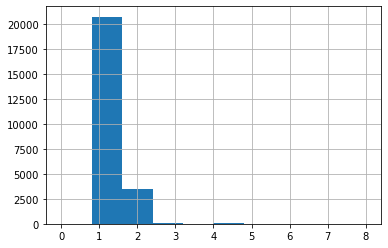

In [65]:
df_subset['number.of.engines'].hist()

In [66]:
df_subset['number.of.engines'].median()

1.0

In [67]:
df_subset['make'] = df_subset['make'].astype(str).str.lower()
pd.set_option('display.max_rows', None)
df_subset['make'].value_counts().head(50)

<ipython-input-67-b180cc4e631c>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_subset['make'] = df_subset['make'].astype(str).str.lower()


cessna                            8415
piper                             4684
beech                             1681
boeing                            1297
mooney                             416
bellanca                           281
grumman                            249
airbus                             243
maule                              232
aeronca                            227
air tractor                        224
cirrus design corp                 220
air tractor inc                    219
champion                           169
luscombe                           163
embraer                            153
stinson                            145
cirrus                             136
north american                     118
mcdonnell douglas                  111
taylorcraft                        110
aero commander                     105
dehavilland                         95
de havilland                        87
aviat aircraft inc                  76
socata                   

In [68]:
def typos(x):
    if "air tractor" in x:
        return "air tractor"
    elif "cessna" in x:
        return "cessna"
    elif "piper" in x:
        return "piper"
    elif "beech" in x:
        return "beech"
    elif "boeing" in x:
        return "boeing"
    elif "mooney" in x:
        return "mooney"
    elif "grumman" in x:
        return "grumman"
    elif "airbus" in x:
        return "airbus"
    elif "aeronca" in x:
        return "aeronca"
    elif "cirrus" in x:
        return "cirrus"
    elif "champion" in x:
        return "american champion"
    elif "embraer" in x:
        return "embraer"
    elif "havilland" in x:
        return "dehavilland"
    elif "aviat" in x:
        return "aviat"
    elif "diamond" in x:
        return "diamond"
    elif "ercoupe" in x:
        return "ercoupe"
    else:
        return x
    
df_subset['make'] = df_subset['make'].map(typos)

<ipython-input-68-2c3c67e34545>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_subset['make'] = df_subset['make'].map(typos)


In [69]:
make_value_counts = df_subset['make'].value_counts()
make_over_100 = make_value_counts.loc[make_value_counts > 100]
make_over_100 = list(make_over_100.index)
df_subset_makes = df_subset.loc[df_subset['make'].isin(make_over_100)]
df_subset_makes.head()
df_subset_makes.to_csv('../Data/df_subset2_makes.csv')

In [70]:
df_subset_makes['total.nonfatal.injuries'] = (df_subset_makes['total.minor.injuries']) + (df_subset_makes['total.serious.injuries'])


<ipython-input-70-1b577743b6b7>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_subset_makes['total.nonfatal.injuries'] = (df_subset_makes['total.minor.injuries']) + (df_subset_makes['total.serious.injuries'])


In [71]:
df_subset_makes.info

<bound method DataFrame.info of        event.date                          location  \
5            1979                                MA   
7            1982                                WA   
8            1982                                NJ   
12           1982                                LA   
13           1982                                TX   
15           1982                                AR   
17           1982                                AK   
18           1982                                PA   
20           1982                                MI   
21           1982                                MI   
23           1982                                CA   
24           1982                                CA   
25           1982                                VA   
26           1982                                NC   
27           1982                                NY   
28           1982                                FL   
29           1982                

In [72]:
df_subset_makes.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20839 entries, 5 to 90345
Data columns (total 19 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   event.date               20839 non-null  int64  
 1   location                 20839 non-null  object 
 2   country                  20839 non-null  object 
 3   aircraft.damage          20839 non-null  object 
 4   aircraft.category        20839 non-null  object 
 5   make                     20839 non-null  object 
 6   model                    20839 non-null  object 
 7   amateur.built            20839 non-null  object 
 8   number.of.engines        20839 non-null  float64
 9   engine.type              17581 non-null  object 
 10  far.description          20465 non-null  object 
 11  schedule                 2433 non-null   object 
 12  total.serious.injuries   20839 non-null  float64
 13  total.fatal.injuries     20839 non-null  float64
 14  total.minor.injuries  

In [73]:
df_subset_makes_1 = df_subset_makes[['location', 'event.date', 'country', 'number.of.engines',
                'aircraft.damage', 'make', 'model', 'engine.type', 'total.fatal.injuries', 
                 'total.nonfatal.injuries',
                'total.uninjured', 
                'weather.condition']]
df_subset_makes_1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20839 entries, 5 to 90345
Data columns (total 12 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   location                 20839 non-null  object 
 1   event.date               20839 non-null  int64  
 2   country                  20839 non-null  object 
 3   number.of.engines        20839 non-null  float64
 4   aircraft.damage          20839 non-null  object 
 5   make                     20839 non-null  object 
 6   model                    20839 non-null  object 
 7   engine.type              17581 non-null  object 
 8   total.fatal.injuries     20839 non-null  float64
 9   total.nonfatal.injuries  20839 non-null  float64
 10  total.uninjured          20839 non-null  float64
 11  weather.condition        20839 non-null  object 
dtypes: float64(4), int64(1), object(7)
memory usage: 2.1+ MB


In [74]:
df_subset_makes.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20839 entries, 5 to 90345
Data columns (total 19 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   event.date               20839 non-null  int64  
 1   location                 20839 non-null  object 
 2   country                  20839 non-null  object 
 3   aircraft.damage          20839 non-null  object 
 4   aircraft.category        20839 non-null  object 
 5   make                     20839 non-null  object 
 6   model                    20839 non-null  object 
 7   amateur.built            20839 non-null  object 
 8   number.of.engines        20839 non-null  float64
 9   engine.type              17581 non-null  object 
 10  far.description          20465 non-null  object 
 11  schedule                 2433 non-null   object 
 12  total.serious.injuries   20839 non-null  float64
 13  total.fatal.injuries     20839 non-null  float64
 14  total.minor.injuries  

In [75]:
replace_dict = {'Unk':'UNK'}
df_subset_makes_1['weather.condition'] = df_subset_makes_1['weather.condition'].replace(replace_dict)
df_subset_makes_1['weather.condition'].value_counts()

<ipython-input-75-4004e8324194>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_subset_makes_1['weather.condition'] = df_subset_makes_1['weather.condition'].replace(replace_dict)


VMC    16893
NA      2465
IMC     1174
UNK      307
Name: weather.condition, dtype: int64

In [76]:
df_subset_makes_1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20839 entries, 5 to 90345
Data columns (total 12 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   location                 20839 non-null  object 
 1   event.date               20839 non-null  int64  
 2   country                  20839 non-null  object 
 3   number.of.engines        20839 non-null  float64
 4   aircraft.damage          20839 non-null  object 
 5   make                     20839 non-null  object 
 6   model                    20839 non-null  object 
 7   engine.type              17581 non-null  object 
 8   total.fatal.injuries     20839 non-null  float64
 9   total.nonfatal.injuries  20839 non-null  float64
 10  total.uninjured          20839 non-null  float64
 11  weather.condition        20839 non-null  object 
dtypes: float64(4), int64(1), object(7)
memory usage: 2.1+ MB


In [77]:
df_subset_makes_1.shape

(20839, 12)

In [78]:
# Turning injury columns into percentage of total passengers
df_subset_makes_1['fatal.injuries.perc'] = round(((df_subset_makes['total.fatal.injuries'] / (df_subset_makes['total.fatal.injuries'] + 
                                                                             df_subset_makes['total.nonfatal.injuries'] + 
                                                                             df_subset_makes['total.uninjured'])) * 100), 1)
df_subset_makes_1['nonfatal.injuries.perc'] = round(((df_subset_makes['total.nonfatal.injuries'] / (df_subset_makes['total.fatal.injuries'] + 
                                                                             df_subset_makes['total.nonfatal.injuries'] + 
                                                                             df_subset_makes['total.uninjured'])) * 100), 1)
df_subset_makes_1['uninjured.perc'] = round(((df_subset_makes['total.uninjured'] / (df_subset_makes['total.fatal.injuries'] + 
                                                                             df_subset_makes['total.nonfatal.injuries'] + 
                                                                             df_subset_makes['total.uninjured'])) * 100), 1)

<ipython-input-78-f28abd30fbcc>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_subset_makes_1['fatal.injuries.perc'] = round(((df_subset_makes['total.fatal.injuries'] / (df_subset_makes['total.fatal.injuries'] +
<ipython-input-78-f28abd30fbcc>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_subset_makes_1['nonfatal.injuries.perc'] = round(((df_subset_makes['total.nonfatal.injuries'] / (df_subset_makes['total.fatal.injuries'] +
<ipython-input-78-f28abd30fbcc>:8: SettingWithCopyWarning: 
A value is t

In [79]:
df_subset_makes_1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20839 entries, 5 to 90345
Data columns (total 15 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   location                 20839 non-null  object 
 1   event.date               20839 non-null  int64  
 2   country                  20839 non-null  object 
 3   number.of.engines        20839 non-null  float64
 4   aircraft.damage          20839 non-null  object 
 5   make                     20839 non-null  object 
 6   model                    20839 non-null  object 
 7   engine.type              17581 non-null  object 
 8   total.fatal.injuries     20839 non-null  float64
 9   total.nonfatal.injuries  20839 non-null  float64
 10  total.uninjured          20839 non-null  float64
 11  weather.condition        20839 non-null  object 
 12  fatal.injuries.perc      20067 non-null  float64
 13  nonfatal.injuries.perc   20067 non-null  float64
 14  uninjured.perc        

In [80]:
df_subset_makes_1.shape

(20839, 15)

In [81]:
df_subset_makes_1.isna().sum()

location                      0
event.date                    0
country                       0
number.of.engines             0
aircraft.damage               0
make                          0
model                         0
engine.type                3258
total.fatal.injuries          0
total.nonfatal.injuries       0
total.uninjured               0
weather.condition             0
fatal.injuries.perc         772
nonfatal.injuries.perc      772
uninjured.perc              772
dtype: int64

In [82]:
df_subset_makes_1['engine.type'] = df_subset_makes_1['engine.type'].fillna('NA')

<ipython-input-82-7981d8946b40>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_subset_makes_1['engine.type'] = df_subset_makes_1['engine.type'].fillna('NA')


In [83]:
df_subset_makes_1.isna().sum()

location                     0
event.date                   0
country                      0
number.of.engines            0
aircraft.damage              0
make                         0
model                        0
engine.type                  0
total.fatal.injuries         0
total.nonfatal.injuries      0
total.uninjured              0
weather.condition            0
fatal.injuries.perc        772
nonfatal.injuries.perc     772
uninjured.perc             772
dtype: int64

In [84]:
df_subset_makes_1['fatal.injuries.perc'] = df_subset_makes_1['fatal.injuries.perc'].fillna(0)
df_subset_makes_1['nonfatal.injuries.perc'] = df_subset_makes_1['nonfatal.injuries.perc'].fillna(0)
df_subset_makes_1['uninjured.perc'] = df_subset_makes_1['uninjured.perc'].fillna(0)

<ipython-input-84-5e9cdeaccd0a>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_subset_makes_1['fatal.injuries.perc'] = df_subset_makes_1['fatal.injuries.perc'].fillna(0)
<ipython-input-84-5e9cdeaccd0a>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_subset_makes_1['nonfatal.injuries.perc'] = df_subset_makes_1['nonfatal.injuries.perc'].fillna(0)
<ipython-input-84-5e9cdeaccd0a>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,co

In [85]:
df_subset_makes_1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20839 entries, 5 to 90345
Data columns (total 15 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   location                 20839 non-null  object 
 1   event.date               20839 non-null  int64  
 2   country                  20839 non-null  object 
 3   number.of.engines        20839 non-null  float64
 4   aircraft.damage          20839 non-null  object 
 5   make                     20839 non-null  object 
 6   model                    20839 non-null  object 
 7   engine.type              20839 non-null  object 
 8   total.fatal.injuries     20839 non-null  float64
 9   total.nonfatal.injuries  20839 non-null  float64
 10  total.uninjured          20839 non-null  float64
 11  weather.condition        20839 non-null  object 
 12  fatal.injuries.perc      20839 non-null  float64
 13  nonfatal.injuries.perc   20839 non-null  float64
 14  uninjured.perc        

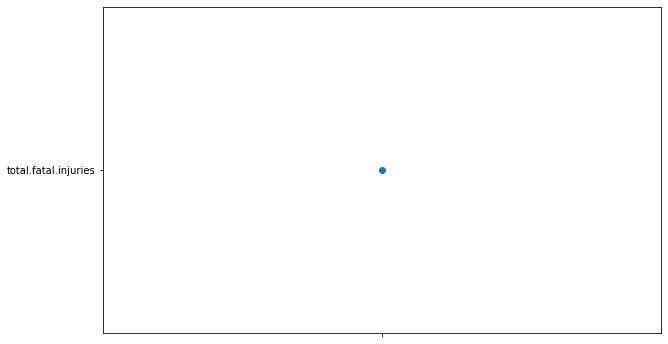

In [86]:
fig, ax = plt.subplots(figsize=(10, 6))
ax.scatter(x='', y='total.fatal.injuries')

In [87]:
df_subset_makes_1['aircraft.damage'].unique()

array(['Substantial', 'Destroyed', 'Minor', 'NA', 'Unknown'], dtype=object)

In [88]:
replace_dict_na = {'Unknown':'NA'}
df_subset_makes_1['aircraft.damage'] = df_subset_makes_1['aircraft.damage'].replace(replace_dict_na)
df_subset_makes_1['aircraft.damage'].value_counts()

<ipython-input-88-09b6036949a4>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_subset_makes_1['aircraft.damage'] = df_subset_makes_1['aircraft.damage'].replace(replace_dict_na)


Substantial    16263
Destroyed       2632
NA              1183
Minor            761
Name: aircraft.damage, dtype: int64

In [89]:
df_subset_makes_1['engine.type'].unique()

array(['Turbo Fan', 'Reciprocating', 'Turbo Prop', 'Turbo Jet', 'NA',
       'Unknown', 'Turbo Shaft', 'Geared Turbofan', 'UNK'], dtype=object)

In [90]:
df_subset_makes_1['engine.type'].value_counts()

Reciprocating      15765
NA                  3258
Turbo Prop           883
Turbo Fan            719
Unknown              108
Turbo Jet             85
Geared Turbofan       12
Turbo Shaft            8
UNK                    1
Name: engine.type, dtype: int64

In [91]:
replace_dict_unk = {'UNK':'Unknown'}
df_subset_makes_1['engine.type'] = df_subset_makes_1['engine.type'].replace(replace_dict_unk)
df_subset_makes_1['engine.type'].value_counts()

<ipython-input-91-57a8aad66045>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_subset_makes_1['engine.type'] = df_subset_makes_1['engine.type'].replace(replace_dict_unk)


Reciprocating      15765
NA                  3258
Turbo Prop           883
Turbo Fan            719
Unknown              109
Turbo Jet             85
Geared Turbofan       12
Turbo Shaft            8
Name: engine.type, dtype: int64

In [92]:
df_subset_makes_1['aircraft.damage'].value_counts()

Substantial    16263
Destroyed       2632
NA              1183
Minor            761
Name: aircraft.damage, dtype: int64

In [93]:
aircraft_damage_encoding = {'NA': 0, 'Minor': 1, 'Destroyed': 2, 'Substantial': 3}
df_subset_makes_1['aircraft.damage'] = df_subset_makes_1['aircraft.damage'].replace(aircraft_damage_encoding)

<ipython-input-93-1d54902404d7>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_subset_makes_1['aircraft.damage'] = df_subset_makes_1['aircraft.damage'].replace(aircraft_damage_encoding)


In [94]:
df_subset_makes_1['aircraft.damage'].value_counts()

3    16263
2     2632
0     1183
1      761
Name: aircraft.damage, dtype: int64

In [95]:
df_subset_makes_1.head(10)

,location,event.date,country,number.of.engines,aircraft.damage,make,model,engine.type,total.fatal.injuries,total.nonfatal.injuries,total.uninjured,weather.condition,fatal.injuries.perc,nonfatal.injuries.perc,uninjured.perc
5,MA,1979,United States,2.0,3,mcdonnell douglas,DC9,Turbo Fan,0.0,1.0,44.0,VMC,0.0,2.2,97.8
7,WA,1982,United States,1.0,3,cessna,140,Reciprocating,0.0,0.0,2.0,VMC,0.0,0.0,100.0
8,NJ,1982,United States,2.0,3,cessna,401B,Reciprocating,0.0,0.0,2.0,IMC,0.0,0.0,100.0
12,LA,1982,United States,1.0,2,bellanca,17-30A,Reciprocating,0.0,1.0,0.0,IMC,0.0,100.0,0.0
13,TX,1982,United States,1.0,2,cessna,R172K,Reciprocating,1.0,0.0,0.0,IMC,100.0,0.0,0.0
15,AR,1982,United States,1.0,2,beech,19,Reciprocating,2.0,0.0,0.0,IMC,100.0,0.0,0.0
17,AK,1982,United States,1.0,2,cessna,180,Reciprocating,3.0,0.0,0.0,VMC,100.0,0.0,0.0
18,PA,1982,United States,1.0,3,cessna,172,Reciprocating,0.0,0.0,1.0,VMC,0.0,0.0,100.0
20,MI,1982,United States,1.0,3,cessna,152,Reciprocating,0.0,0.0,1.0,VMC,0.0,0.0,100.0
21,MI,1982,United States,1.0,3,cessna,150L,Reciprocating,0.0,0.0,2.0,VMC,0.0,0.0,100.0


In [96]:
df_subset_makes_1.isna().sum()

location                   0
event.date                 0
country                    0
number.of.engines          0
aircraft.damage            0
make                       0
model                      0
engine.type                0
total.fatal.injuries       0
total.nonfatal.injuries    0
total.uninjured            0
weather.condition          0
fatal.injuries.perc        0
nonfatal.injuries.perc     0
uninjured.perc             0
dtype: int64

In [ ]:
df_subset_makes_1.to_csv('../Data/data_subset_make_cleaned.csv')

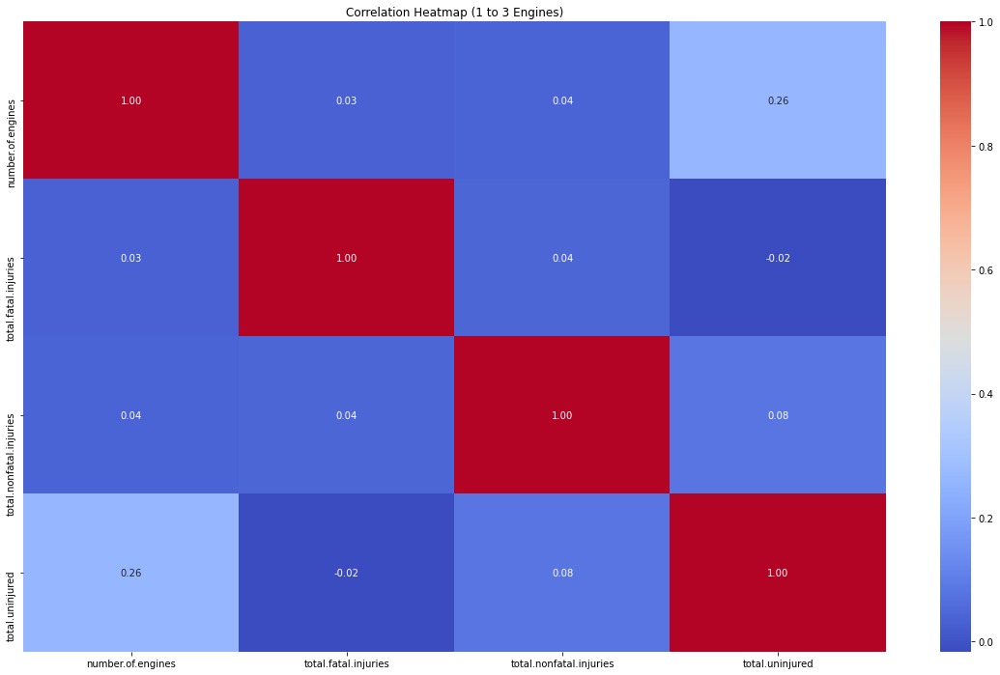

In [97]:
# Filtering the dataset for 'number.of.engines' up to 3
filtered_data = df_subset_makes_1[df_subset_makes_1['number.of.engines'].isin([1, 2, 3])]
relevant_columns = ['number.of.engines', 'total.fatal.injuries', 'total.nonfatal.injuries', 'total.uninjured']
# Recalculating the correlation matrix for the filtered data
filtered_correlation_matrix = filtered_data[relevant_columns].corr()

# Creating the heatmap for the filtered data
plt.figure(figsize=(20, 12))
sns.heatmap(filtered_correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap (1 to 3 Engines)')
plt.show()

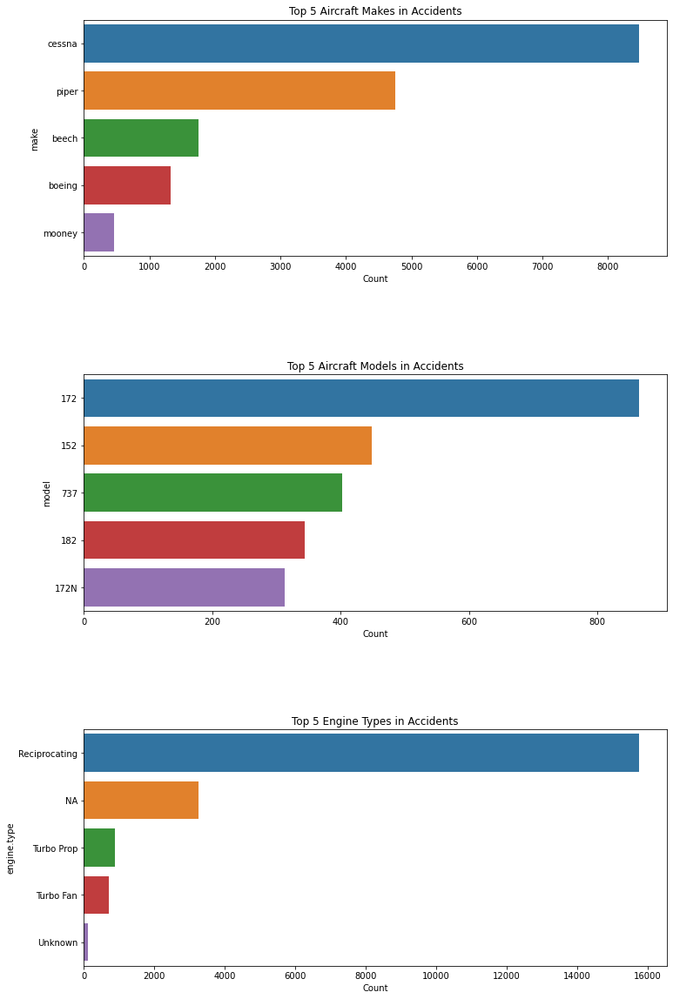

In [98]:
number_of_categories = 5


def plot_top_n_categories(df_subset_makes_1, column, title, ax):
    top_categories = df_subset_makes_1[column].value_counts().head(number_of_categories)
    sns.barplot(x=top_categories.values, y=top_categories.index, ax=ax)
    ax.set_title(title)
    ax.set_xlabel('Count')
    ax.set_ylabel(column)


fig, axes = plt.subplots(3, 1, figsize=(12, 20))
plt.subplots_adjust(hspace=0.5)

plot_top_n_categories(df_subset_makes_1, 'make', 'Top 5 Aircraft Makes in Accidents', axes[0])

plot_top_n_categories(df_subset_makes_1, 'model', 'Top 5 Aircraft Models in Accidents', axes[1])

plot_top_n_categories(df_subset_makes_1, 'engine.type', 'Top 5 Engine Types in Accidents', axes[2])

plt.show()